# Highly-multiplexed image analysis with `Harpy` and `Kronos`.

In this notebook we will use an annotated `CODEX` datataset (Shaban M. et al. (2023) https://zenodo.org/records/10067010).

To run this notebook, make sure to install [`harpy`](https://github.com/saeyslab/harpy) and [`kronos`](https://github.com/mahmoodlab/KRONOS).

```bash
uv venv .venv_harpy_kronos --python=3.12
source .venv_harpy_kronos/bin/activate
uv pip install "git+https://github.com/saeyslab/harpy.git@main"
uv pip install "git+https://github.com/mahmoodlab/KRONOS.git#egg=kronos[tutorials]"
```

In [2]:
import os

import harpy as hp

# This will download approximately 24GB. By setting the environment varialble 'HARPY_POOCH_CACHE' in a .env file, one can specify where this data will be cached.
sdata = hp.datasets.codex_example()

path = os.environ.get("SCRATCHDIR")  # choose an output directory of choice.
sdata.write(os.path.join(path, "sdata_codex.zarr"))

# Fetch the csv file containing the mapping between the data specific marker names and the marker names used by Kronos.
registry = hp.datasets.get_registry()
matched_channels_path = registry.fetch("proteomics/codex/chl_maps_dataset/marker_metadata_mapped.csv")

Before running the `Harpy` function `hp.tb.featurize`, please make sure the image and the segmentation mask, have the same spatial chunksize on disk.

Using a smaller chunksize in `c`, `y` and `x` will reduce RAM usage.

If not, you could rechunk as follows:

```Python
sdata = hp.im.add_image_layer( 
    sdata,
    arr=sdata["image"][ "scale0" ]["image"].data.rechunk( ( 10,2048,2048 ) ),
    output_layer = "image",
    scale_factors=[2,2,2,2],
    c_coords = sdata["image"][ "scale0" ]["image"].c.data,
    overwrite=True,
 )

 sdata = hp.im.add_labels_layer( 
    sdata,
    arr=sdata["segmentation_mask"][ "scale0" ]["image"].data.rechunk( ( 2048,2048 ) ),
    output_layer = "image",
    scale_factors=[2,2,2,2],
    overwrite=True,
 )
 ```

In [3]:
display(sdata["image"]["scale0"]["image"])
display(sdata["segmentation_mask"]["scale0"]["image"])

<xarray.DataArray 'image' (c: 49, y: 8011, x: 8085)> Size: 6GB
dask.array<from-zarr, shape=(49, 8011, 8085), dtype=uint16, chunksize=(10, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * c        (c) <U11 2kB 'BCL-2' 'CCR6' 'CD11B' ... 'A-SMA' 'B-CATENIN'
  * y        (y) float64 64kB 0.5 1.5 2.5 3.5 ... 8.008e+03 8.01e+03 8.01e+03
  * x        (x) float64 65kB 0.5 1.5 2.5 3.5 ... 8.082e+03 8.084e+03 8.084e+03
Attributes:
    transform:  {'global': Identity }

<xarray.DataArray 'image' (y: 8011, x: 8085)> Size: 259MB
dask.array<from-zarr, shape=(8011, 8085), dtype=int32, chunksize=(2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 64kB 0.5 1.5 2.5 3.5 ... 8.008e+03 8.01e+03 8.01e+03
  * x        (x) float64 65kB 0.5 1.5 2.5 3.5 ... 8.082e+03 8.084e+03 8.084e+03
Attributes:
    transform:  {'global': Identity }

The `AnnData` table `"table_intensities"`in the `SpatialData` object `sdata` contains the main intensity (in `sdata["table_intensities"].X`) for each instance in the segmentation mask `segmentation_mask`. These mean intensities where calculated as follows:

```python
hp.tb.allocate_intensity(
  sdata,
  img_layer="image",
  labels_layer="segmentation_mask",
  output_layer=table_layer,
  mode="mean",
  calculate_center_of_mass=True,
  overwrite=True,
  )
```

In [4]:
sdata["table_intensities"].to_df().head()

channels,BCL-2,CCR6,CD11B,CD11C,CD15,CD16,CD162,CD163,CD2,CD20,...,PD-L1,PODOPLANIN,T-BET,TCR-G-D,TCRB,TIM-3,VISA,VIMENTIN,A-SMA,B-CATENIN
cells,,,,,,,,,,,,,,,,,,,,,
1_segmentation_mask_3314222a,34272.214844,1579.261963,1.000000,1.000000,1.000000,1088.190430,37.214287,113.309525,7561.904785,51194.882812,...,630.404785,591.785706,1664.023804,5099.714355,531.071411,60.666668,1.000000,2658.666748,4.547619,58.119049
2_segmentation_mask_3314222a,0.000000,325.746033,2291.952393,14611.238281,1304.349243,41.190475,823.365051,151.888885,33.047619,0.412698,...,1127.000000,1.000000,118.333336,1740.126953,194.634918,1025.888916,402.714294,16652.603516,2.539683,268.000000
3_segmentation_mask_3314222a,2622.344727,344.517242,2660.862061,2214.655273,3181.965576,1082.896606,1.000000,113.724136,88.724136,1043.000000,...,1177.758667,1.000000,273.344818,1515.206909,0.000000,45.965519,1001.137939,1358.206909,6.000000,105.206894
4_segmentation_mask_3314222a,0.250000,32.906250,2395.468750,4671.671875,0.453125,705.953125,80.031250,3040.734375,1629.125000,1.000000,...,364.453125,31.156250,30.375000,0.000000,174.687500,1361.390625,503.000000,1070.484375,182.000000,283.906250
5_segmentation_mask_3314222a,8693.557617,282.901642,1.000000,210.622955,1.000000,41.606556,3547.672119,168.672134,6995.393555,2731.491699,...,186.098358,60.786884,882.737732,1170.868896,1991.655762,122.836067,0.983607,4394.360840,30.295082,0.000000


In [5]:
import pandas as pd

matched_channels = pd.read_csv(matched_channels_path)
matched_channels.head()

,marker_name,marker_name_pretrained,marker_id_pretrained,marker_mean,marker_std,marker_id
0,BCL-2,BCL2,150,0.047104,0.060276,0
1,CCR6,CCR6,166,0.044867,0.042833,1
2,CD11B,CD11B,180,0.032169,0.052366,2
3,CD11C,CD11C,182,0.019039,0.044336,3
4,CD15,CD15,194,0.016322,0.040416,4


In [7]:
from dask.distributed import Client, LocalCluster

cluster = LocalCluster(
    n_workers=4,
    threads_per_worker=1,
    memory_limit="32GB",
    local_directory=os.environ.get("SCRATCHDIR"),  # directory where dask will spill to disk
)

client = Client(cluster)
print(client.dashboard_link)

http://127.0.0.1:8787/status


In [ ]:
import pandas as pd

import harpy as hp

HF_AUTH_TOKEN = os.environ.get("HF_AUTH_TOKEN")

# you could choose to specify a local path as the checkpoint path for the kronos model. By default it will download the kronos model from the Hugging Face hub "hf_hub:MahmoodLab/kronos".
# checkpoint_path = "/data/groups/technologies/spatial.catalyst/Arne/kronos_example_data/models--MahmoodLab--kronos/snapshots/8edc2719ad67b2e2b766073b35c6cf8e6f5da516/kronos_vits16_model.pt"

# you could choose to set markers_to_keep = None
markers_to_keep = [
    "DAPI-01",
    "CD11B",
    "CD11C",
    "CD15",
    "CD163",
    "CD20",
    "CD206",
    "CD30",
    "CD31",
    "CD4",
    "CD56",
    "CD68",
    "CD7",
    "CD8",
    "CYTOKERITIN",
    "FOXP3",
    "MCT",
    "PODOPLANIN",
]
matched_channels = matched_channels[matched_channels["marker_name"].isin(markers_to_keep)]

# keyword arguments passed to hp.utils.kronos_embedding
model_kwargs = {
    "hf_auth_token": HF_AUTH_TOKEN,
    "matched_channels": matched_channels,
    "max_value": 65535.0,
    "do_instance_embedding": False,
}

table_layer = "table_intensities"

sdata = hp.tb.featurize(
    sdata,
    img_layer="image",
    labels_layer="segmentation_mask",
    table_layer=table_layer,
    output_layer=table_layer,
    depth=200,
    diameter=16 * 4,  # kronos patch sizes must be multiples of 16
    embedding_dimension=384
    * matched_channels.shape[0],  # all channels are matched, so it is embedding_dim*num_channels
    model=hp.utils.kronos_embedding,
    model_kwargs=model_kwargs,
    batch_size=250,
    overwrite=True,
)
client.close()

In [6]:
sdata["table_intensities"].obsm["embedding"].shape  # -> kronos embedding

(152815, 6912)

In [9]:
from sklearn.cluster import KMeans

kmeans = KMeans(
    n_clusters=20,
    random_state=0,
)

labels = kmeans.fit_predict(sdata[table_layer].obsm["embedding"])

sdata[table_layer].obs["kronos"] = labels
sdata[table_layer].obs["kronos"] = sdata[table_layer].obs["kronos"].astype("category")

# back cluster ids to zarr
sdata = hp.tb.add_table_layer(
    sdata,
    adata=sdata[table_layer],
    output_layer=table_layer,
    region=["segmentation_mask"],
    overwrite=True,
)

2025-11-10 14:14:29,191 - harpy.utils._io - WARNING - layer with name 'table_intensities' already exists. Overwriting...


In [10]:
# normalize before calculating leiden clusters
sdata = hp.tb.preprocess_proteomics(
    sdata,
    labels_layer="segmentation_mask",
    table_layer=table_layer,
    output_layer=f"{table_layer}_normalized",
    size_norm=False,
    log1p=False,
    q=0.99,
    max_value_q=1,
    overwrite=True,
)

2025-11-10 14:14:54,673 - harpy.table._preprocess - INFO - Calculating cell size from provided labels_layer 'segmentation_mask'
/Users/arnedf/.local/share/uv/python/cpython-3.12.11-macos-aarch64-none/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
2025-11-10 14:14:55,428 - harpy.table._preprocess - INFO - Saving non preprocessed data matrix to '.layers[raw_counts]'.
/Users/arnedf/VIB/harpy/.venv_harpy/lib/python3.12/site-packages/spatialdata/models/models.py:1183: UserWarning: Converting `region_key: fov_labels` to categorical dtype.
  convert_region_column_to_categorical(adata)
2025-11-10 14:15:07,721 - harpy.utils._io - WARNING - layer with name 'table_intensities_normalized' already exists. Overwriting...


In [11]:
sdata[f"{table_layer}_normalized"].to_df().head()

channels,BCL-2,CCR6,CD11B,CD11C,CD15,CD16,CD162,CD163,CD2,CD20,...,PD-L1,PODOPLANIN,T-BET,TCR-G-D,TCRB,TIM-3,VISA,VIMENTIN,A-SMA,B-CATENIN
cells,,,,,,,,,,,,,,,,,,,,,
1_segmentation_mask_3314222a,79.668221,62.177567,0.011111,0.004568,0.003408,14.284677,0.796612,1.115642,36.489056,100.000000,...,8.457295,11.425946,24.895376,68.573784,16.188705,0.666807,0.045563,13.841380,4.506205,5.740132
2_segmentation_mask_3314222a,0.000000,12.825038,25.464931,66.745941,4.445347,0.540707,17.625029,1.495494,0.159467,0.000900,...,15.119448,0.019308,1.770379,23.398777,5.933077,11.275876,18.348717,86.695709,2.516554,26.469042
3_segmentation_mask_3314222a,6.095829,13.564084,29.563736,10.116818,10.844443,14.215184,0.021406,1.119725,0.428128,2.274806,...,15.800408,0.019308,4.089499,20.374371,0.000000,0.505222,45.614468,7.071009,5.945360,10.390767
4_segmentation_mask_3314222a,0.000581,1.295561,26.615061,21.340773,0.001544,9.267047,1.713156,29.938982,7.861145,0.002181,...,4.889379,0.601552,0.454439,0.000000,5.325017,14.963484,22.917997,5.573087,100.000000,28.040024
5_segmentation_mask_3314222a,20.208799,11.138199,0.011111,0.962152,0.003408,0.546169,75.941795,1.660741,33.755424,5.957442,...,2.496632,1.173647,13.206595,15.744198,60.711853,1.350131,0.044816,22.877638,30.019194,0.000000


In [15]:
# takes approx 20 minutes

# try leiden clustering with these filtered out: [ "EGFR", "FOXP3", "PD-L1", "T-BET", "TCR-G-D", "CD56", "CD69" ]

sdata = hp.tb.leiden(
    sdata,
    labels_layer="segmentation_mask",
    table_layer=f"{table_layer}_normalized",
    output_layer=f"{table_layer}_normalized",
    key_added="leiden",
    overwrite=True,
)

/Users/arnedf/VIB/harpy/.venv_harpy/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Users/arnedf/VIB/harpy/.venv_harpy/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/Users/arnedf/VIB/harpy/.venv_harpy/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/Users/arnedf/VIB/harpy/.venv_harpy/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/arnedf/VIB/harpy/.venv_harpy/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_fu

In [16]:
sdata[f"{table_layer}_normalized"].obs.head()

,cell_ID,fov_labels,x_center,y_center,cell_type,cell_type_id,kronos,shapeSize,leiden
cells,,,,,,,,,
1_segmentation_mask_3314222a,1,segmentation_mask,75.0,2.0,B,0.0,10,42,6
2_segmentation_mask_3314222a,2,segmentation_mask,1767.0,2.0,DC,3.0,7,63,1
3_segmentation_mask_3314222a,3,segmentation_mask,2545.0,2.0,NK,11.0,7,29,2
4_segmentation_mask_3314222a,4,segmentation_mask,2899.0,3.0,Monocyte,10.0,7,64,2
5_segmentation_mask_3314222a,5,segmentation_mask,3657.0,3.0,CD4,1.0,7,61,0


In [17]:
for _cluster in ["kronos", "leiden"]:
    sdata = hp.tb.cluster_intensity(
        sdata,
        table_layer=f"{table_layer}_normalized",
        labels_layer="segmentation_mask",
        output_layer=f"{table_layer}_normalized",
        cluster_key=_cluster,
        layer_mean_intensities="raw_counts",  # layer in adata.layers that holds the mean intensities
        overwrite=True,
    )
    hp.pl.cluster_intensity_heatmap(
        sdata,
        table_layer=f"{table_layer}_normalized",
        cluster_key=_cluster,
        figsize=(15, 10),
    )

2025-11-10 14:29:20,379 - harpy.table._cluster_intensity - INFO - Weighted (by instance size) average intensity per cluster (cluster key: 'kronos') will be stored in 'sdata[table_intensities_normalized].uns[kronos_weighted_intensity]'.
2025-11-10 14:29:40,834 - harpy.utils._io - WARNING - layer with name 'table_intensities_normalized' already exists. Overwriting...
2025-11-10 14:30:03,109 - harpy.table._cluster_intensity - INFO - Weighted (by instance size) average intensity per cluster (cluster key: 'leiden') will be stored in 'sdata[table_intensities_normalized].uns[leiden_weighted_intensity]'.


: 

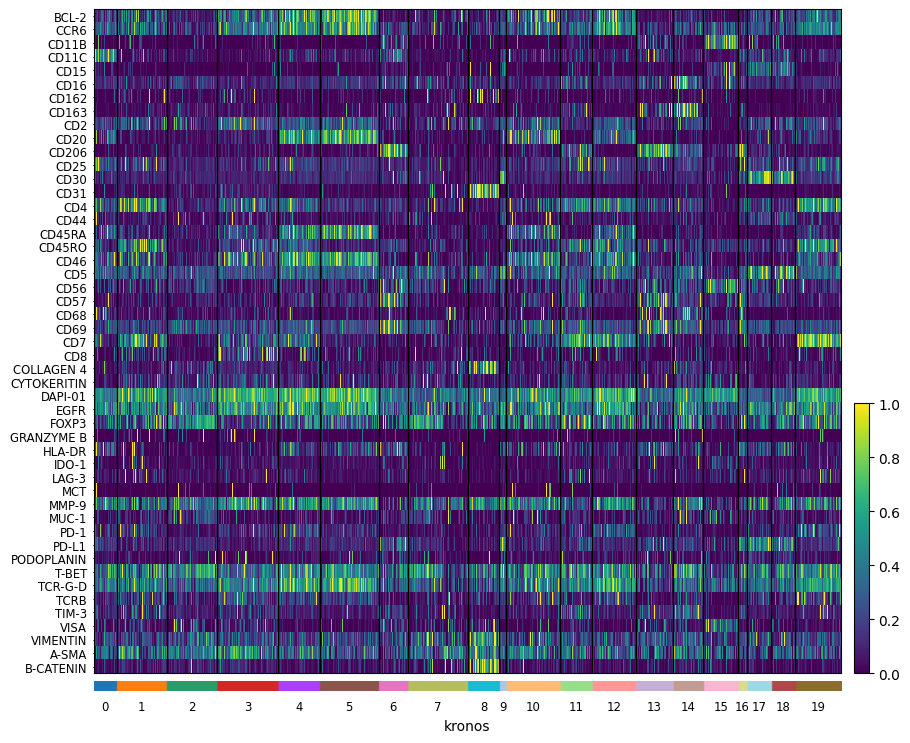

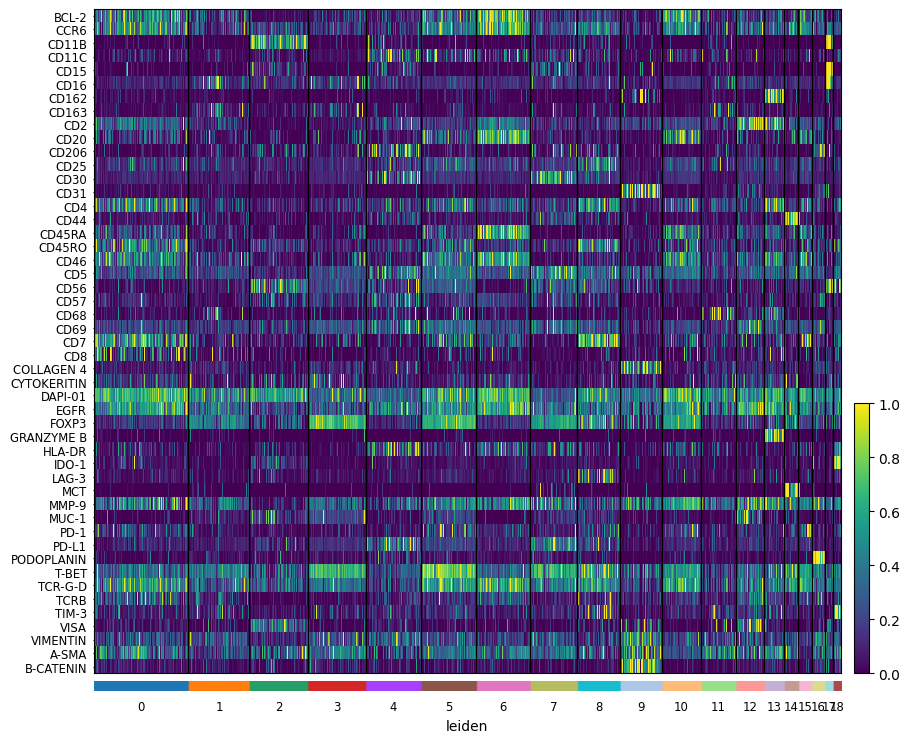

In [20]:
import scanpy as sc
from matplotlib.colors import Normalize

norm = Normalize(vmax=1, clip=False)
sc.pl.heatmap(
    sdata[f"{table_layer}_normalized"],
    var_names=sdata[f"{table_layer}_normalized"].var_names,
    groupby="kronos",
    swap_axes=True,
    norm=norm,
    use_raw=False,
)

sc.pl.heatmap(
    sdata[f"{table_layer}_normalized"],
    var_names=sdata[f"{table_layer}_normalized"].var_names,
    groupby="leiden",
    swap_axes=True,
    norm=norm,
    use_raw=False,
)

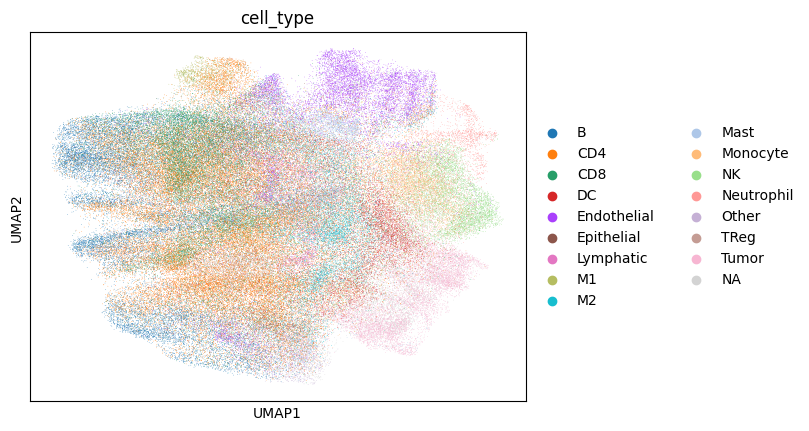

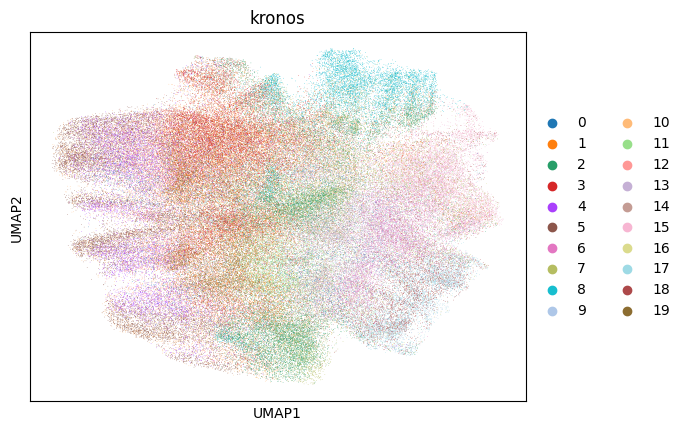

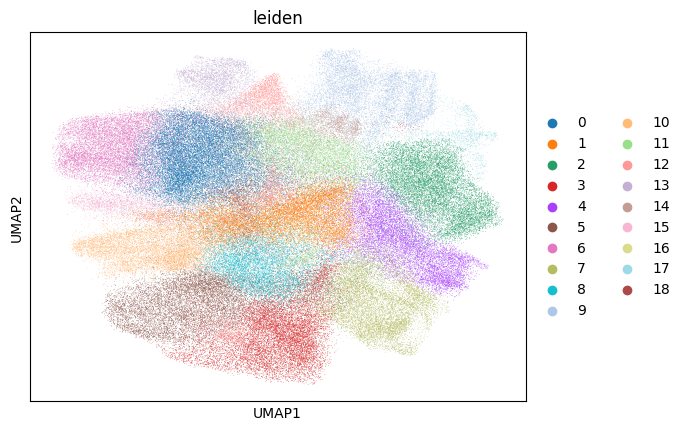

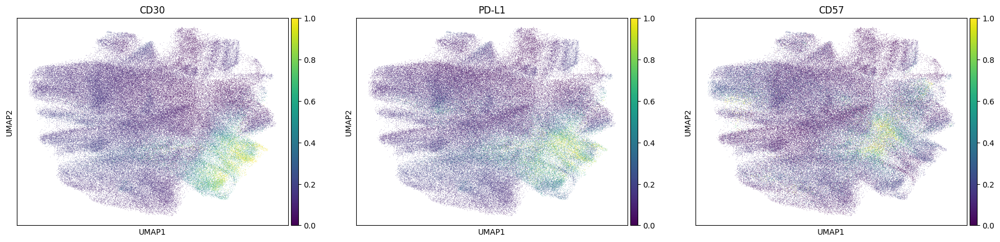

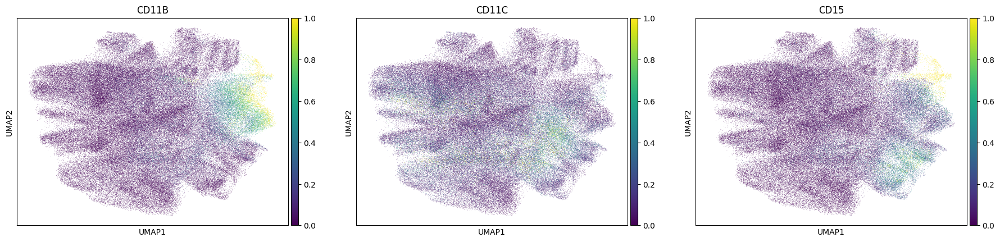

In [21]:
import scanpy as sc
from matplotlib.colors import Normalize

sc.pl.umap(sdata[f"{table_layer}_normalized"], color=["cell_type"])

for _cluster_key in ["kronos", "leiden"]:
    sc.pl.umap(sdata[f"{table_layer}_normalized"], color=[_cluster_key])

norm = Normalize(vmax=1, clip=False)
sc.pl.umap(sdata[f"{table_layer}_normalized"], color=["CD30", "PD-L1", "CD57"], norm=norm, use_raw=False)

sc.pl.umap(sdata[f"{table_layer}_normalized"], color=["CD11B", "CD11C", "CD15"], norm=norm, use_raw=False)

Cramers v: 0.40833263281018034
Chi-squared statistic: 359473.4853451965
p-value: 0.0


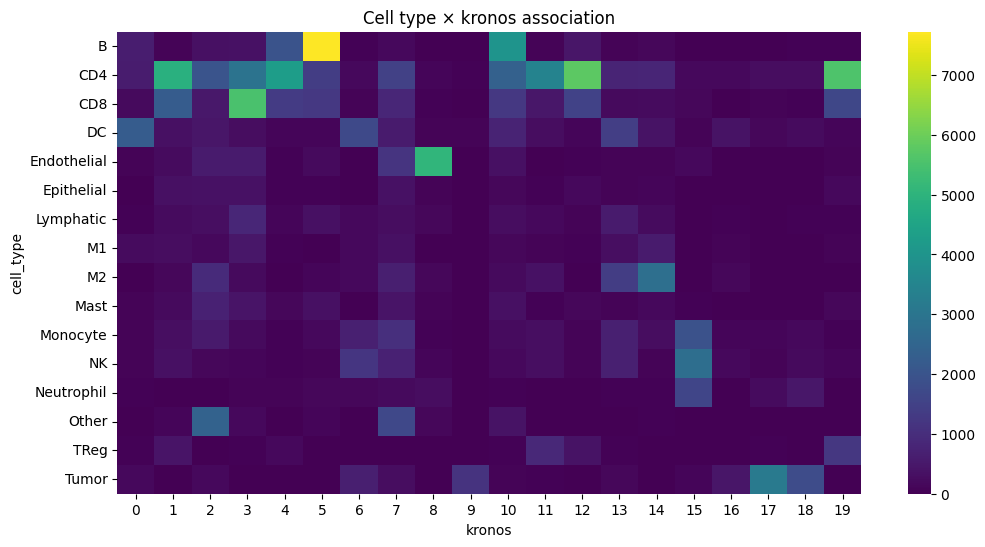

       cell_type kronos  std_residual   abs_resid
88   Endothelial      8    239.920615  239.920615
317        Tumor     17    190.376840  190.376840
5              B      5    173.119357  173.119357
174           M2     14    143.902390  143.902390
235           NK     15    125.539999  125.539999
309        Tumor      9    122.268829  122.268829
318        Tumor     18    114.545215  114.545215
262        Other      2    112.218924  112.218924
60            DC      0    110.584902  110.584902
255   Neutrophil     15    108.023549  108.023549
43           CD8      3    101.712499  101.712499
215     Monocyte     15     87.373576   87.373576
10             B     10     80.813422   80.813422
32           CD4     12     72.044409   72.044409
66            DC      6     72.007998   72.007998
267        Other      7     68.878832   68.878832
299         TReg     19     67.417829   67.417829
39           CD4     19     64.061963   64.061963
173           M2     13     57.987977   57.987977


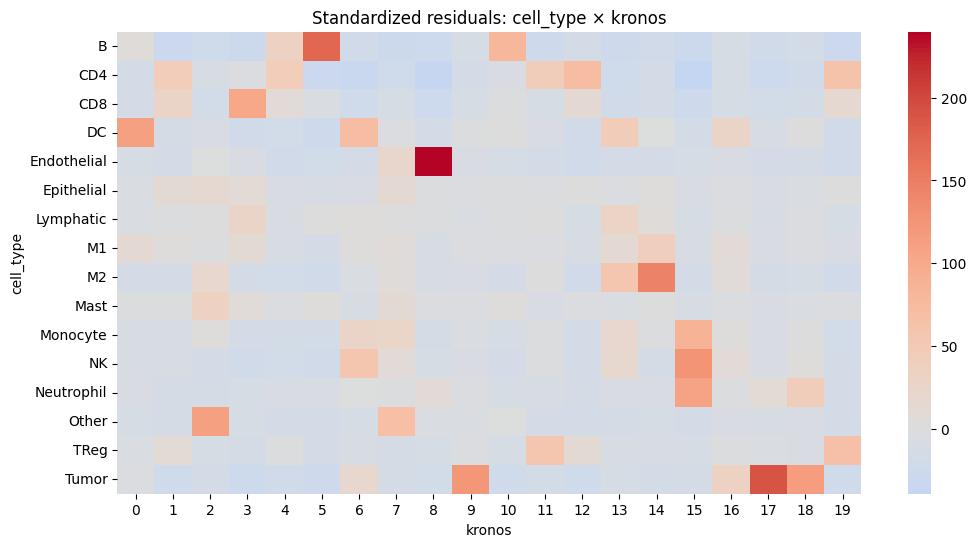

Cramers v: 0.5068884584269632
Chi-squared statistic: 553940.9736261503
p-value: 0.0


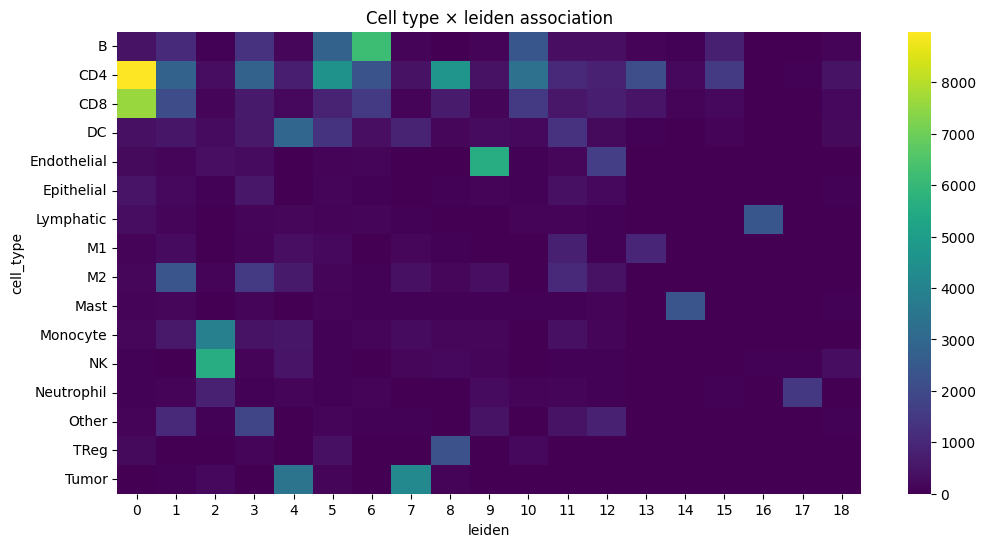

       cell_type leiden  std_residual   abs_resid
130    Lymphatic     16    284.480572  284.480572
185         Mast     14    283.874694  283.874694
85   Endothelial      9    232.907870  232.907870
245   Neutrophil     17    230.219524  230.219524
211           NK      2    203.081277  203.081277
292        Tumor      7    192.814143  192.814143
274         TReg      8    146.471389  146.471389
6              B      6    140.396353  140.396353
192     Monocyte      2    138.977966  138.977966
289        Tumor      4    120.588860  120.588860
38           CD8      0    107.692420  107.692420
146           M1     13     93.238551   93.238551
61            DC      4     89.255996   89.255996
250        Other      3     76.785316   76.785316
153           M2      1     71.869715   71.869715
88   Endothelial     12     70.046925   70.046925
19           CD4      0     55.244127   55.244127
144           M1     11     54.117454   54.117454
27           CD4      8     51.988591   51.988591


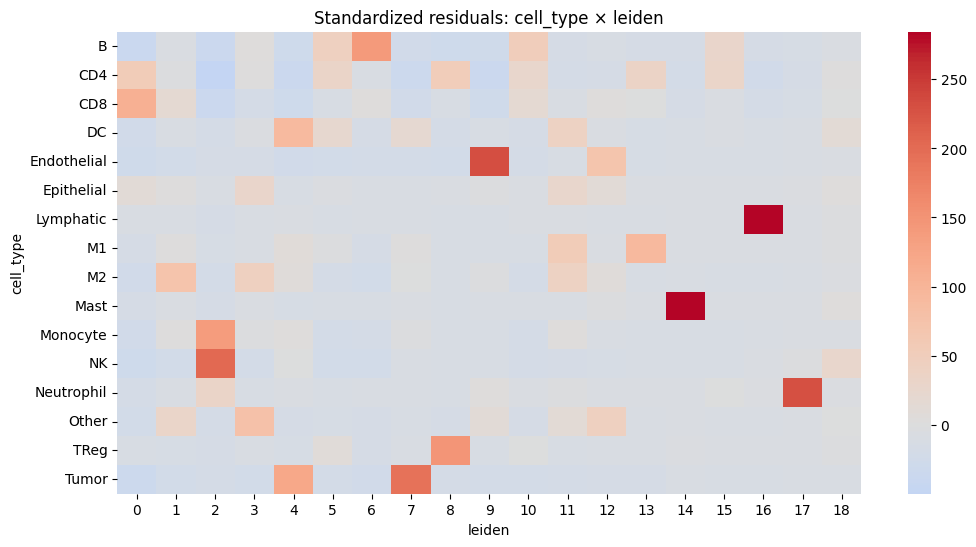

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import chi2_contingency

for _cluster_key in ["kronos", "leiden"]:
    df = sdata[f"{table_layer}_normalized"].obs

    df = df[~df["cell_type_id"].isna()]

    contingency = pd.crosstab(df["cell_type"], df[_cluster_key])

    # chi squared test
    chi2, p, dof, expected = chi2_contingency(contingency)

    # cramers v
    def _cramers_v(confusion_matrix):
        chi2 = chi2_contingency(confusion_matrix)[0]
        n = confusion_matrix.sum().sum()
        phi2 = chi2 / n
        r, k = confusion_matrix.shape
        return np.sqrt(phi2 / min(k - 1, r - 1))

    print("Cramers v:", _cramers_v(contingency))

    print("Chi-squared statistic:", chi2)
    print("p-value:", p)

    plt.figure(figsize=(12, 6))
    sns.heatmap(contingency, cmap="viridis")
    plt.title(f"Cell type × {_cluster_key} association")
    plt.show()

    # Calculate standardized residuals
    residuals = (contingency - expected) / np.sqrt(expected)

    residuals_df = pd.DataFrame(residuals, index=contingency.index, columns=contingency.columns)

    resid_long = residuals_df.stack().reset_index()
    resid_long.columns = ["cell_type", _cluster_key, "std_residual"]

    # Sort by strength of deviation
    resid_long["abs_resid"] = resid_long["std_residual"].abs()
    top_effects = resid_long.sort_values("abs_resid", ascending=False).head(20)
    print(top_effects)

    plt.figure(figsize=(12, 6))
    sns.heatmap(residuals_df, center=0, cmap="coolwarm", annot=False)
    plt.title(f"Standardized residuals: cell_type × {_cluster_key}")
    plt.show()

INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   


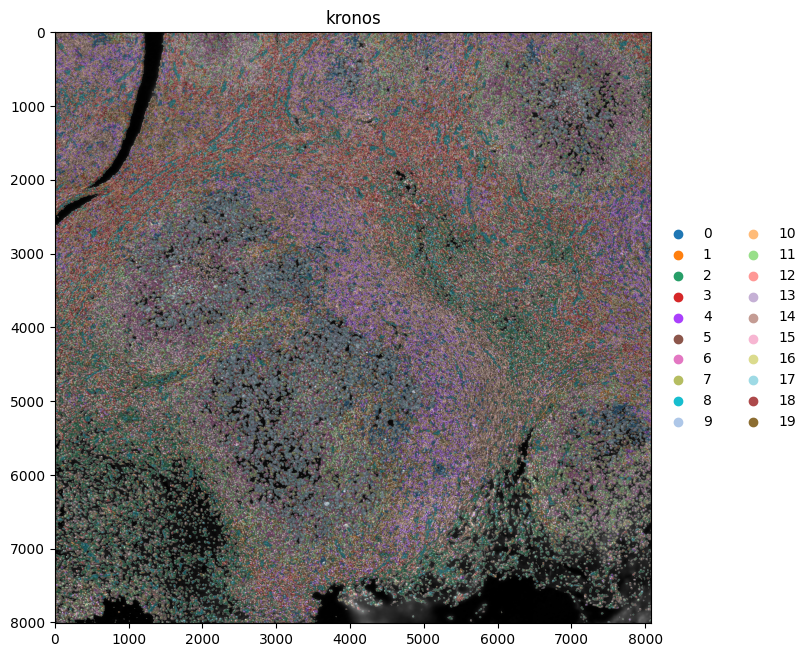

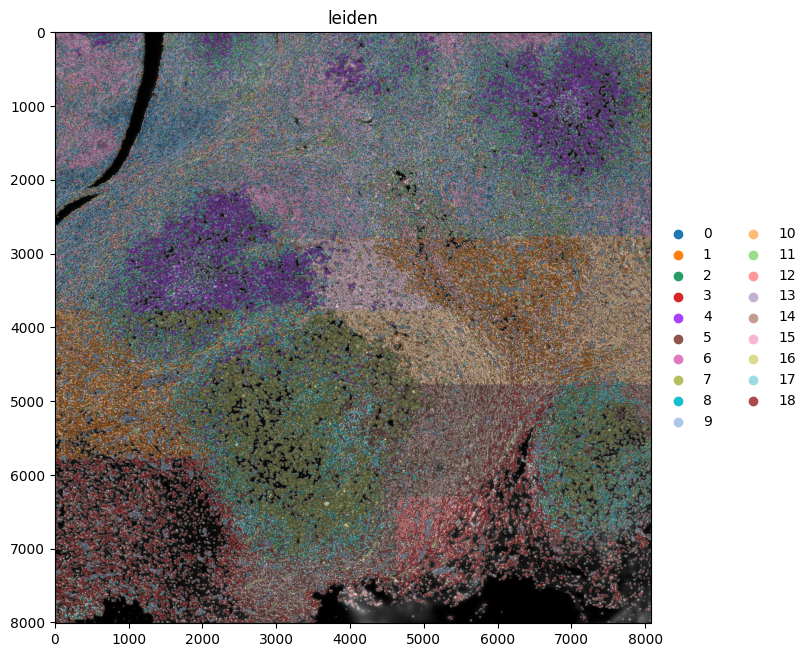

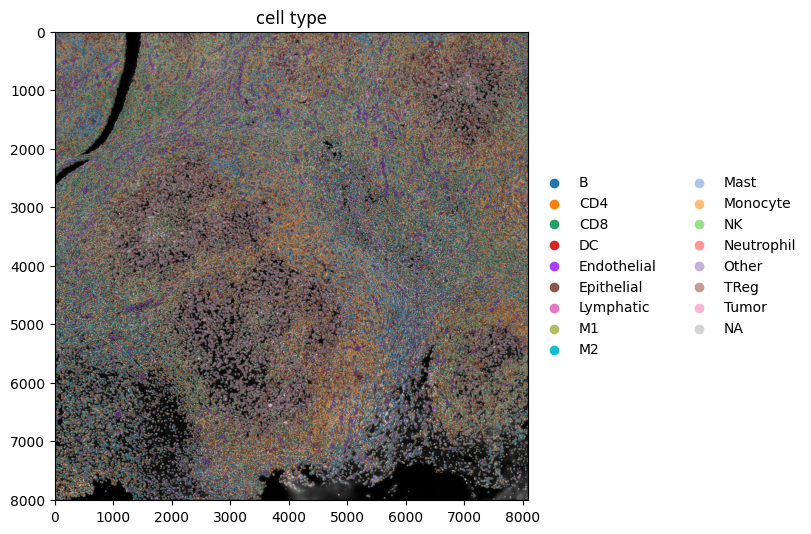

In [10]:
import dask.array as da
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

from harpy.image._image import _get_spatial_element

c = "DAPI-01"

table_layer = f"{table_layer}_normalized"

se = _get_spatial_element(sdata, layer="image")
channels = se.c.data

c_id = np.where(channels == c)[0].item()
vmax = da.percentile(se.data[c_id].flatten(), q=99).compute()  # clip to 99% percentile
norm = Normalize(vmax=vmax, clip=True)

render_images_kwargs = {
    "cmap": "grey",
    "norm": norm,
    "scale": "scale3",
}
render_labels_kwargs = {
    "scale": "scale2",
    "fill_alpha": 0.2,
    "outline_alpha": 0.3,
}

show_kwargs = {"title": "kronos", "colorbar": False, "dpi": 100, "figsize": (8, 8)}
ax = hp.pl.plot_spatialdata(
    sdata,
    ax=None,
    img_layer="image",
    channel=c,
    labels_layer="segmentation_mask",
    table_layer=table_layer,
    color="kronos",
    render_images_kwargs=render_images_kwargs,
    render_labels_kwargs=render_labels_kwargs,
    show_kwargs=show_kwargs,
)

show_kwargs = {"title": "leiden", "colorbar": False, "dpi": 100, "figsize": (8, 8)}
ax = hp.pl.plot_spatialdata(
    sdata,
    ax=None,
    img_layer="image",
    channel=c,
    labels_layer="segmentation_mask",
    table_layer=table_layer,
    color="leiden",
    render_images_kwargs=render_images_kwargs,
    render_labels_kwargs=render_labels_kwargs,
    show_kwargs=show_kwargs,
)

show_kwargs = {"title": "cell type", "colorbar": False, "dpi": 100, "figsize": (8, 8)}
ax = hp.pl.plot_spatialdata(
    sdata,
    ax=None,
    img_layer="image",
    channel=c,
    labels_layer="segmentation_mask",
    table_layer=table_layer,
    color="cell_type",
    render_images_kwargs=render_images_kwargs,
    render_labels_kwargs=render_labels_kwargs,
    show_kwargs=show_kwargs,
)

The tiling effects in the `leiden` clusters are caused by the tiling effects visible in some of the channels

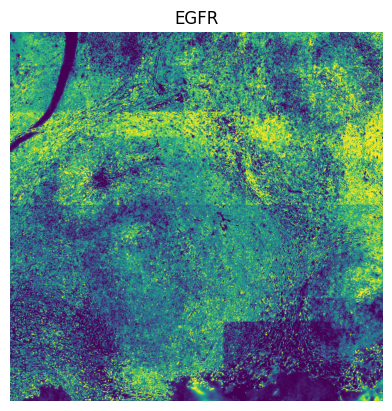

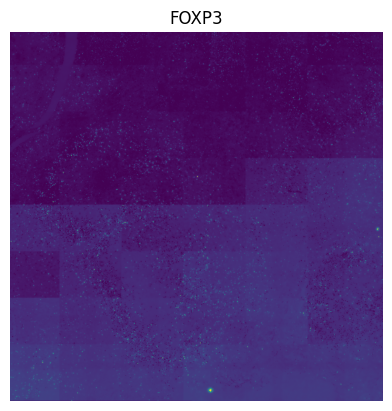

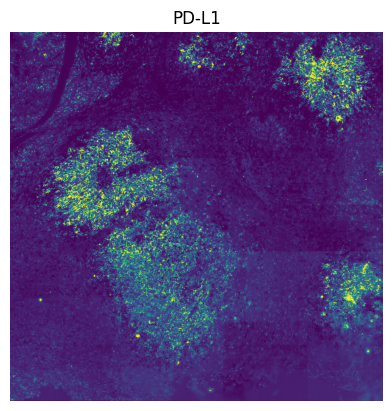

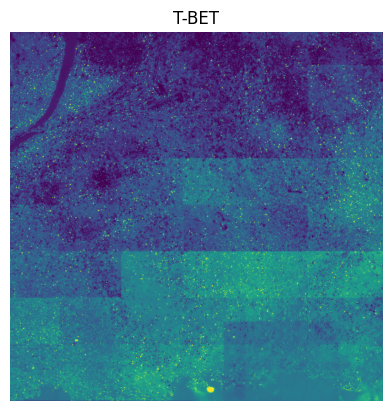

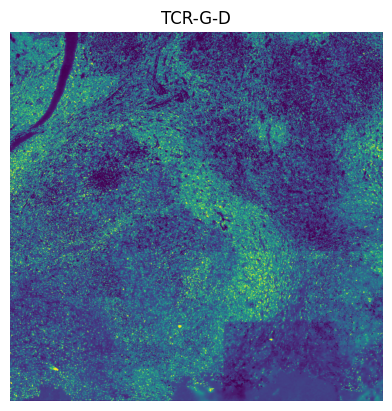

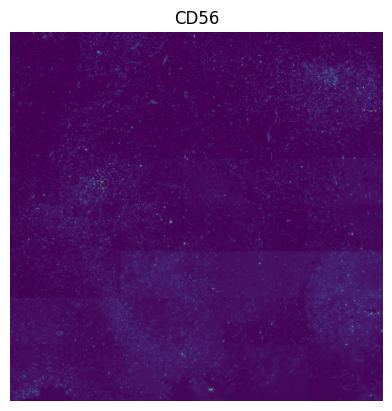

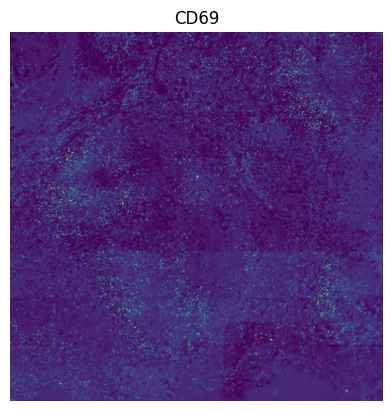

In [8]:
norm = Normalize(vmin=0, vmax=10000, clip=True)

render_images_kwargs = {
    "cmap": "viridis",
    "norm": norm,
    "scale": "scale3",
}

for channel in [
    "EGFR",
    "FOXP3",
    "PD-L1",
    "T-BET",
    "TCR-G-D",
    "CD56",
    "CD69",
]:  # these channels causing tiling artefact in leiden clustering.
    show_kwargs = {"title": str(channel), "colorbar": False, "dpi": 100, "figsize": (4, 4)}

    ax = hp.pl.plot_spatialdata(
        sdata,
        ax=None,
        img_layer="image",
        channel=channel,
        render_images_kwargs=render_images_kwargs,
        show_kwargs=show_kwargs,
    )
    ax.axis("off")